In [1]:
import nltk 
nltk.download("book")
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     C:\Users\User\AppData\Roaming

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


## Bi-gramas

In [2]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)

In [3]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

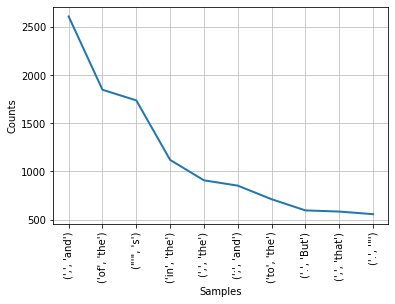

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [4]:
fdist.plot(10)

### Filtrado de bi-gramas

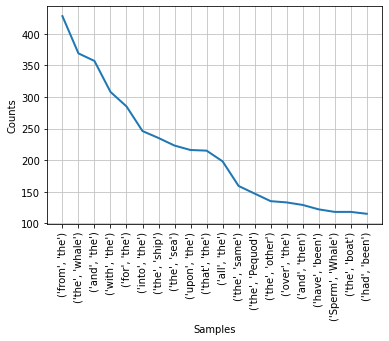

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [5]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

## Tri-gramas

In [6]:
from nltk.util import ngrams
md_trigrams = list(ngrams(text1, 3))
fdist = FreqDist(md_trigrams)
fdist.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

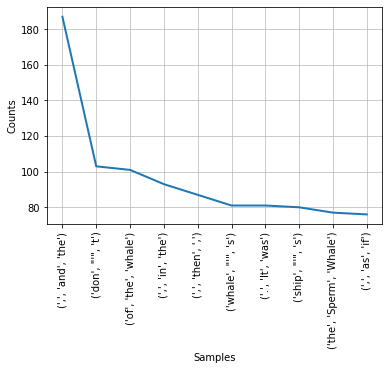

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [7]:
fdist.plot(10)

## Colocaciones

In [8]:
md_bigrrams = list(bigrams(text1))

threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_bigrams_dist = FreqDist(filtered_bigrams)

filtered_words = [word for word in text1 if len(word)>threshold]
filtered_word_dist = FreqDist(filtered_words)

df = pd.DataFrame()
df['bi_grams'] = list(set(filtered_bigrams))
df['word_0'] = df['bi_grams'].apply(lambda x: x[0])
df['word_1'] = df['bi_grams'].apply(lambda x: x[1])

df['bi_gram_freq'] = df['bi_grams'].apply(lambda x: filtered_bigrams_dist[x])
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq'] = df['word_1'].apply(lambda x: filtered_word_dist[x])

In [9]:
df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(the, vial)",the,vial,2,13721,8
1,"(forth, prophecies)",forth,prophecies,1,52,1
2,"(back, the)",back,the,6,151,13721
3,"(finally, wholly)",finally,wholly,1,23,27
4,"(Romish, mass)",Romish,mass,1,3,39
...,...,...,...,...,...,...
67937,"(scornfully, champed)",scornfully,champed,1,1,1
67938,"(smell, almost)",smell,almost,1,11,186
67939,"(drowned, all)",drowned,all,1,12,1462
67940,"(the, east)",the,east,6,13721,12


## Pointwise Mutual Information (PMI)
Una metrica basada en *Teoría de la Información* para encontrar **Collocations**

\begin{equation}
    PMI = \log\left(\dfrac{P(w_{1},w_{2})}{P(w_{1}) P(w_{2})}\right)
\end{equation}

In [12]:
df['PMI'] = df[['bi_gram_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x: np.log2(x.values[0]/(x.values[1]*x.values[2])), axis=1)
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x))
df

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(the, vial)",the,vial,2,13721,8,-15.744098,1.000000
1,"(forth, prophecies)",forth,prophecies,1,52,1,-5.700440,0.000000
2,"(back, the)",back,the,6,151,13721,-18.397540,2.584963
3,"(finally, wholly)",finally,wholly,1,23,27,-9.278449,0.000000
4,"(Romish, mass)",Romish,mass,1,3,39,-6.870365,0.000000
...,...,...,...,...,...,...,...,...
67937,"(scornfully, champed)",scornfully,champed,1,1,1,0.000000,0.000000
67938,"(smell, almost)",smell,almost,1,11,186,-10.998590,0.000000
67939,"(drowned, all)",drowned,all,1,12,1462,-14.098690,0.000000
67940,"(the, east)",the,east,6,13721,12,-14.744098,2.584963


In [13]:
df.sort_values(by = 'PMI', ascending = False)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
64340,"(bombazine, cloak)",bombazine,cloak,1,1,1,0.000000,0.0
67181,"(sanctum, sanctorum)",sanctum,sanctorum,1,1,1,0.000000,0.0
44282,"(Trade, Winds)",Trade,Winds,1,1,1,0.000000,0.0
29163,"(luxuriant, profusion)",luxuriant,profusion,1,1,1,0.000000,0.0
54589,"(homeless, selves)",homeless,selves,1,1,1,0.000000,0.0
...,...,...,...,...,...,...,...,...
37954,"(man, the)",man,the,1,508,13721,-22.732783,0.0
2094,"(some, the)",some,the,1,578,13721,-22.919024,0.0
28980,"(one, the)",one,the,1,889,13721,-23.540138,0.0
65530,"(the, not)",the,not,1,13721,1103,-23.851315,0.0


In [15]:
fig = px.scatter(x = df['PMI'].values, y = df['log(bi_gram_freq)'], color = df['PMI']+df['log(bi_gram_freq)'], 
                 hover_name = df['bi_grams'].values, width = 600, height = 600, labels = {'x': 'PMI', 'y': 'Log(Bigram_frequency)'})
fig.show()